<h2><center>Прогнозирование временных рядов</center></h2>

### 2. Работа с пропущенными значениями и выбросами


определяем, есть ли пропуски

In [ ]:
ts.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
100,2017-08-11,2018-09-30,416,3,20,0,0,0,D
101,2017-08-11,2018-09-30,416,3,20,0,0,0,D
102,2017-08-02,2018-09-30,425,3,20,0,0,0,D
103,2017-08-08,2018-09-30,419,3,20,0,0,0,D
104,2017-08-07,2018-09-30,420,3,20,0,0,0,D
105,2017-07-28,2018-09-30,430,3,20,0,0,0,D
106,2017-08-09,2018-09-30,418,3,20,0,0,0,D
74,2017-08-16,2018-09-30,411,3,20,0,0,0,D
85,2017-08-03,2018-09-30,424,3,20,0,0,0,D


заполняем пропуски скользящим средним

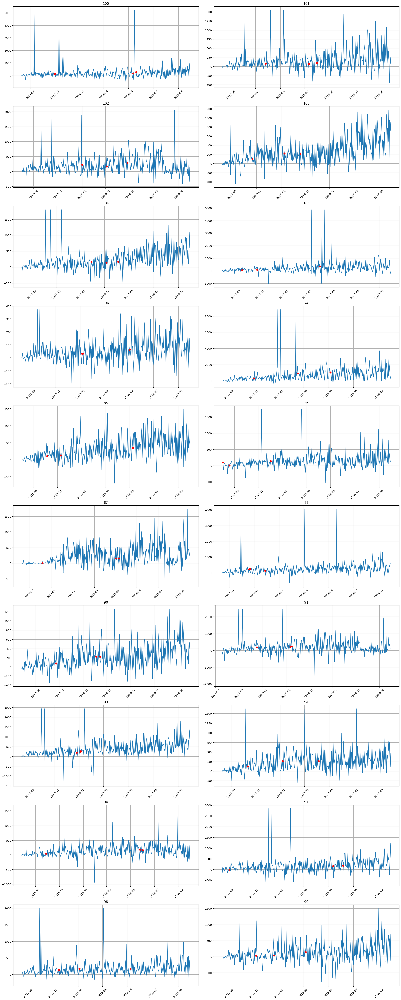

In [ ]:
from etna.transforms import TimeSeriesImputerTransform
from etna.analysis import plot_imputation
imputer = TimeSeriesImputerTransform(strategy="running_mean", window=30)
plot_imputation(imputer=imputer, ts=ts2)

в ts2 сохраняем копию с заполненными пропусками

In [ ]:
ts2.fit_transform([imputer])

Проверим ряды на наличие выбросов

Начнем с медианного метода. За окно берем 30 дней (месяц)

In [ ]:
from etna.analysis import get_anomalies_density
from etna.analysis import get_anomalies_median
from etna.analysis import plot_anomalies
from etna.analysis import plot_anomalies_interactive

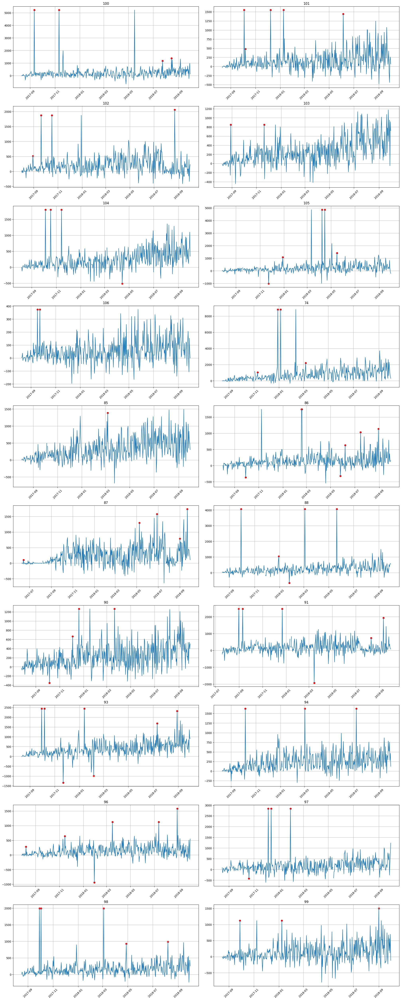

In [ ]:
anomalies = get_anomalies_median(ts, window_size=30)
plot_anomalies(ts, anomalies)

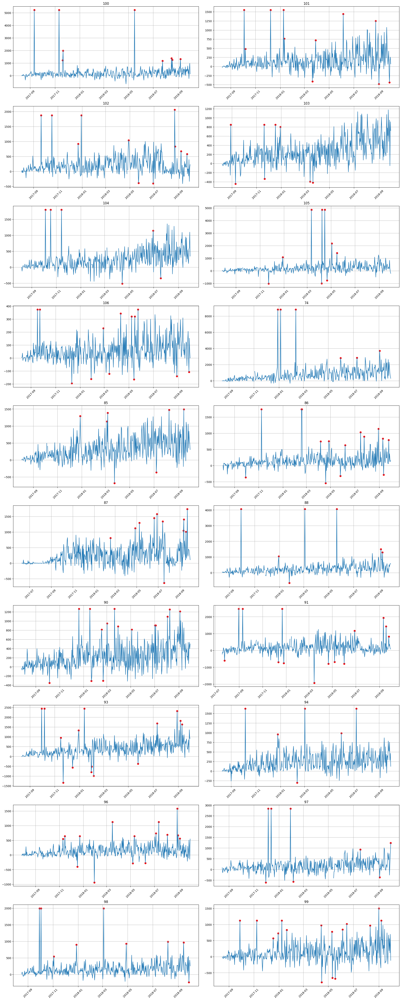

In [ ]:
anomalies = get_anomalies_density(ts, window_size=30, distance_coef=1, n_neighbors=4)
plot_anomalies(ts, anomalies)

Визуально метод с плотностью лучше находит выбросы, но поиграемся с интерактивным графиком и различными наборами параметров для определенного сегмента (взяла 105й, потому что кажется, это один из немногих, где я глазками могу определить, что является выбросом, а что - закономерное поведение ряда)

In [ ]:
segment = "105"
method = get_anomalies_density
params_bounds = {"window_size": (10, 300, 10), "distance_coef": (0.1, 5, 0.1), 'n_neighbors' : (1, 10, 1),}
plot_anomalies_interactive(ts=ts, segment=segment, method=method, params_bounds=params_bounds)

interactive(children=(IntSlider(value=10, continuous_update=False, description='window_size', max=300, min=10,…

In [ ]:
segment = "105"
method = get_anomalies_median
params_bounds = {"window_size": (10, 300, 10), "alpha": (0.1, 5, 0.1)}
plot_anomalies_interactive(ts=ts, segment=segment, method=method, params_bounds=params_bounds)

interactive(children=(IntSlider(value=10, continuous_update=False, description='window_size', max=300, min=10,…

На мой взгляд анализ по плотности точнее находит выбросы, поэтому далее буду использовать его с подобранными выше параметрами

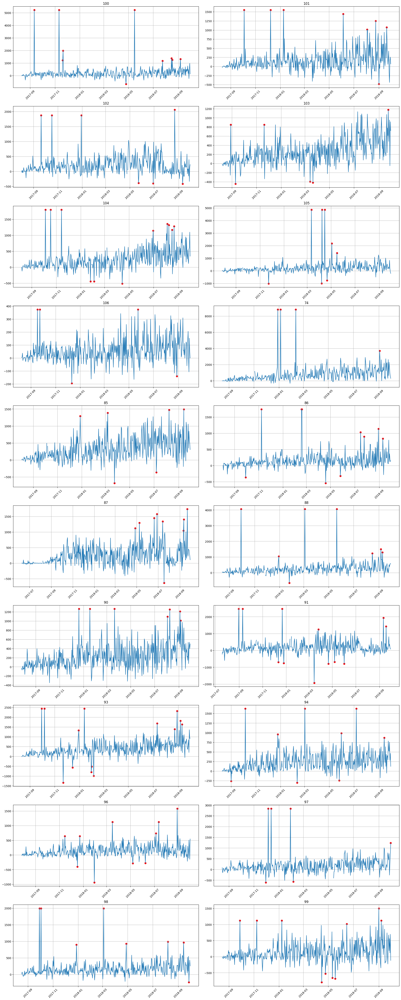

In [ ]:
anomalies = get_anomalies_density(ts, window_size=200, distance_coef=0.7, n_neighbors=9)
plot_anomalies(ts, anomalies)

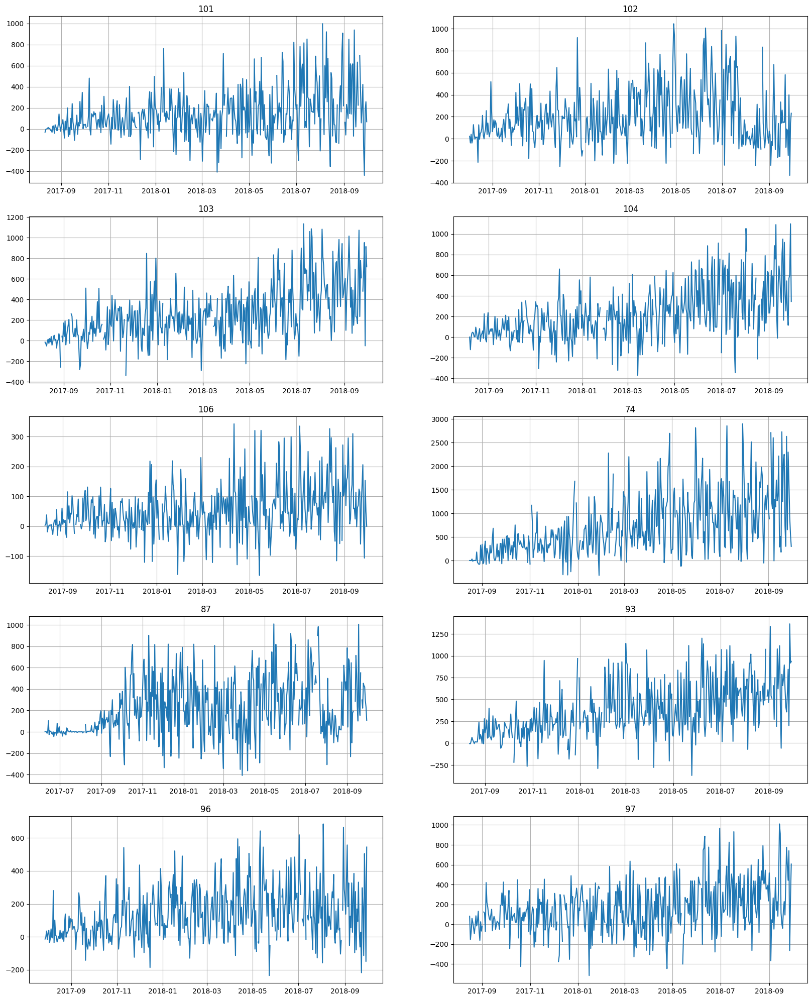

In [ ]:
from etna.transforms import DensityOutliersTransform
outliers = DensityOutliersTransform(in_column="target", window_size=200, distance_coef=0.7, n_neighbors=9)
ts.fit_transform([outliers])
ts.plot()

### 3. Построение Prophet

In [ ]:
from etna.pipeline import Pipeline
from etna.models import ProphetModel
from etna.metrics import SMAPE, MAE
from etna.analysis import plot_backtest

In [ ]:
HORIZON = 5

In [ ]:
ts3.fit_transform([outliers])
ts3.fit_transform([imputer])

In [ ]:
model = ProphetModel()
pipeline = Pipeline(model=model, horizon=HORIZON)
metrics1, forecast1, fold_info1 = pipeline.backtest(ts=ts3, metrics=[SMAPE(), MAE()])

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp6odsmenl/zbknm_71.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp6odsmenl/ighenwa6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83956', 'data', 'file=/tmp/tmp6odsmenl/zbknm_71.json', 'init=/tmp/tmp6odsmenl/ighenwa6.json', 'output', 'file=/tmp/tmp6odsmenl/prophet_model34u7cp19/prophet_model-20240523140414.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling yearly seasonalit

In [ ]:
metrics1.head()

,segment,SMAPE,MAE,fold_number
0,100,64.769018,175.314450,0
0,100,81.475145,228.055830,1
0,100,107.746427,251.516934,2
0,100,47.969824,188.742808,3
0,100,110.566945,365.780837,4


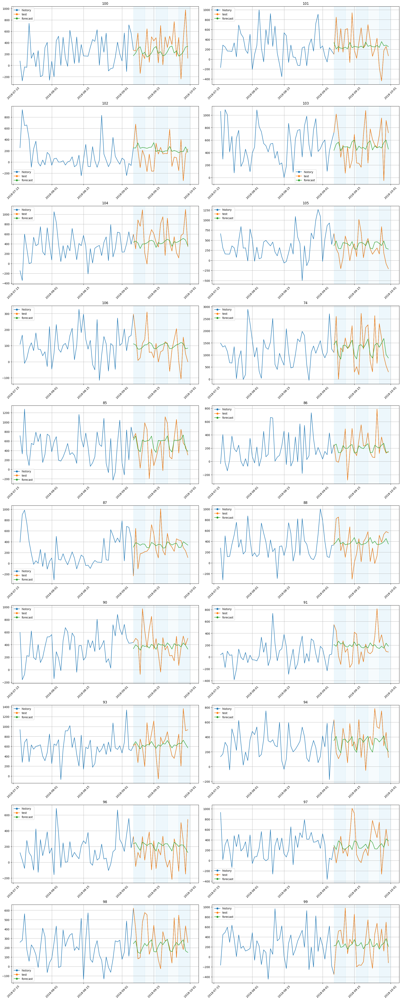

In [ ]:
plot_backtest(forecast1, ts3, history_len=50)

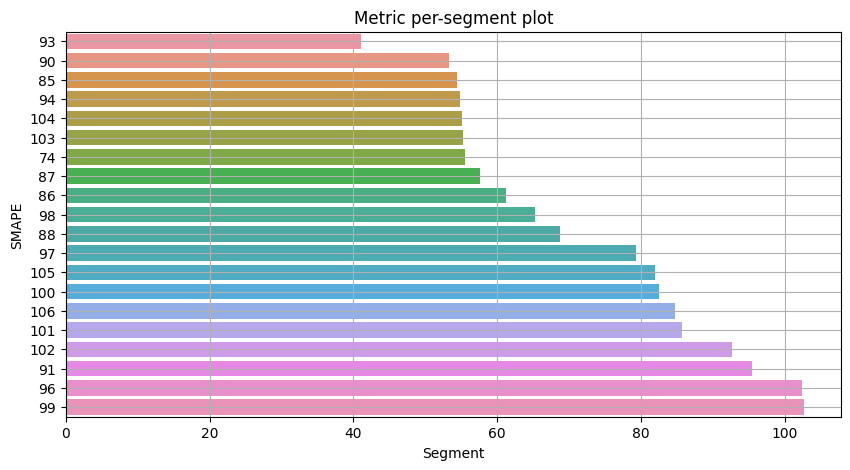

In [ ]:
from etna.analysis import plot_metric_per_segment
plot_metric_per_segment(metrics_df=metrics1, metric_name="SMAPE", ascending=True)

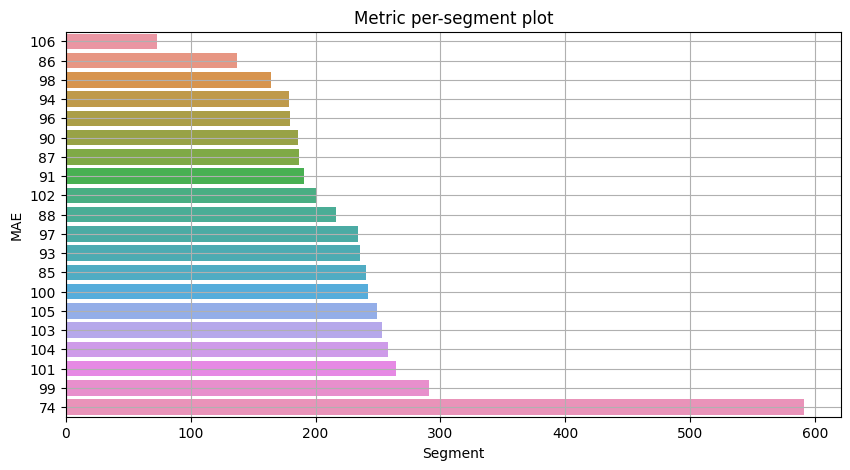

In [ ]:
plot_metric_per_segment(metrics_df=metrics1, metric_name="MAE", ascending=True)

Визуальный анализ графиков и метрик (в которых кстати название осей перепутано) показывает, что прогноз получился очень хиленький. Пока сравнивать не с чем, но хочется верить, что есть способы поточнее

Для сравнения со следующими моделями еще средние значения выведу

In [ ]:
metrics1[['SMAPE', 'MAE']].mean()

SMAPE     71.493732
MAE      228.496843
dtype: float64

### 4. Иерархический временной ряд

Вопрос, поставленный в прошлом задании, тем не менее, естественным образом подводит нас к концепции **иерархического временного ряда** (когда один ряд состоит из других в качестве компонент). Это полезная концепция, которая может встретиться во многих задачах.

In [ ]:
from etna.datasets import HierarchicalStructure
from etna.pipeline import HierarchicalPipeline
from etna.reconciliation import TopDownReconciliator

In [ ]:
new_df = df.copy()
# отрицательные значения заменим на нолик, иначе все ломается
new_df['target'] = new_df['target'].apply(lambda x: max(x, 0))

segment_list = new_df['segment'].astype(str).unique().tolist()
hierarchical_structure = HierarchicalStructure(level_structure={"total": segment_list}, level_names=["total", "atm_id"])

h_ts = TSDataset(new_df, freq='D', hierarchical_structure=hierarchical_structure)
h_ts.head()

segment,100,101,102,103,104,105,106,74,85,86,87,88,90,91,93,94,96,97,98,99
feature,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target
timestamp,,,,,,,,,,,,,,,,,,,,
2017-06-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.617780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.441486,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2017-06-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.398647,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
ahp_reconciliator = TopDownReconciliator(
    target_level="atm_id", source_level="total", method="AHP", period=7
)
ahp_reconciliator.fit(h_ts)

TopDownReconciliator(target_level = 'atm_id', source_level = 'total', period = 7, method = 'AHP', )

Примените найденные на предыдущих этапах преобразования, очистку от выбросов уже к иерархическому датасету и запустим на нем Prophet с MAE на кросс-валидации.

In [ ]:
pipeline_h = HierarchicalPipeline(
    transforms=[imputer,outliers],
    model=ProphetModel(),
    reconciliator=ahp_reconciliator,
    horizon=HORIZON
)

metrics_h, forecast_h, fold_info_h = pipeline_h.backtest(h_ts, metrics=[SMAPE(), MAE()], n_folds=10, aggregate_metrics=True)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp6odsmenl/6s6yhy53.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp6odsmenl/vqya9h5j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81612', 'data', 'file=/tmp/tmp6odsmenl/6s6yhy53.json', 'init=/tmp/tmp6odsmenl/vqya9h5j.json', 'output', 'file=/tmp/tmp6odsmenl/prophet_modelkdov2z6d/prophet_model-20240523140448.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
14:04:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
14:04:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
[Parallel(n_jobs=1)]: Done   1 tasks    

In [ ]:
metrics_h

,segment,SMAPE,MAE
0,100,87.747818,299.857193
1,101,99.267028,276.712760
2,102,140.114583,197.989597
3,103,60.986816,302.391044
4,104,60.608307,268.936122
5,105,91.360147,300.683824
6,106,89.482605,83.058475
7,74,54.879833,627.080291
8,85,75.355107,305.044226
9,86,89.513007,199.568882


In [ ]:
metrics_h[['SMAPE', 'MAE']].mean()

SMAPE     84.015257
MAE      265.593897
dtype: float64

Средние ошибки выросли, а значит качество прогноза стало хуже чем было в предыдущей части

### 5. Построение признаков

Вернемся к нашему исходному мультисегментному ряду - теперь поработаем с моделями, которые требуют построения признаков - `ARIMA` и `CatBoost`. Построим для них признаки, и попробуем при помощи них добиться улучшения качества.

In [ ]:
from etna.analysis import acf_plot, stl_plot
from etna.ensembles import DirectEnsemble, StackingEnsemble, VotingEnsemble
from etna.models import (CatBoostMultiSegmentModel, CatBoostPerSegmentModel,
                         AutoARIMAModel)
from etna.transforms import STLTransform, LagTransform, SegmentEncoderTransform

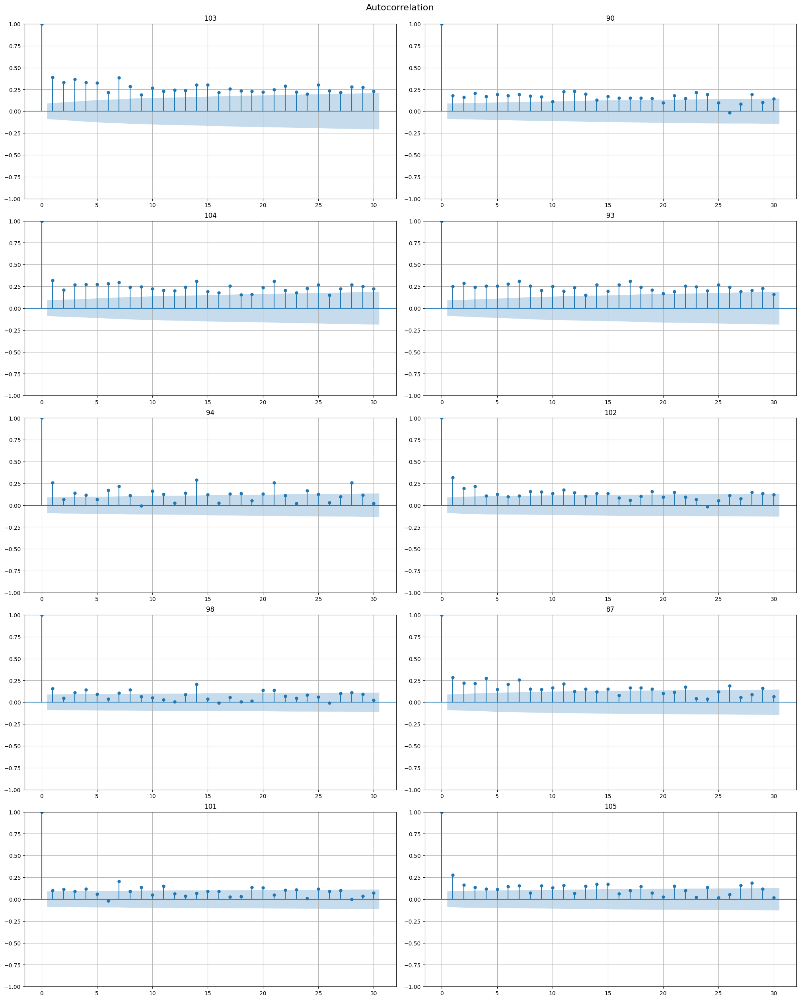

In [ ]:
acf_plot(ts, lags=30)

Как и ранее, много где виден значимый 7й лаг

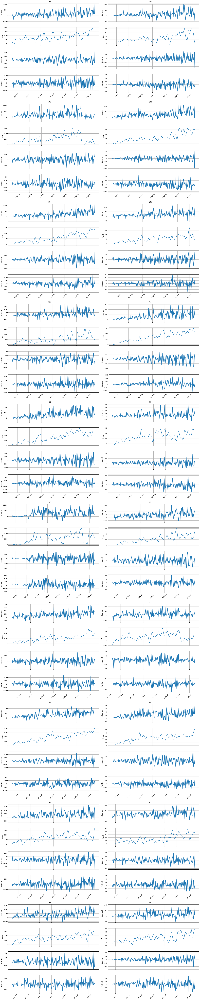

In [ ]:
stl_plot(ts3, period = 7)

In [ ]:
lag_transf = LagTransform(in_column="target", lags=[7], out_column="lag")
stl = STLTransform('target', 7)

Для ясности: ts - удалены выбросы, ts1 - использовался только в корреляции, ts2 - заполнены пропуски, ts3 - удалены выбросы а потом заполнены пропуски. Соответственно для заданий ниже использую ts3

Начимаем эксперименты с аримы

In [ ]:
pipeline = Pipeline(
    transforms=[lag_transf],
    model=AutoARIMAModel(),
    horizon=HORIZON
)

metrics_a, forecast_a, fold_info_a = pipeline.backtest(ts=ts3, metrics=[SMAPE(), MAE()], n_folds=5, n_jobs=2, aggregate_metrics=True)

metrics_a

[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:  7.4min
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:  7.4min
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed: 14.6min remaining:  9.7min
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed: 18.7min finished
[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:    5.3s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:    6.1s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:   13.2s remaining:    8.8s
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed:   16.5s finished
[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:    0.5s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:    0.8s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:    1.4s remaining:    0

,segment,SMAPE,MAE
0,100,83.113148,247.994033
1,101,82.534763,255.251239
2,102,116.266976,191.309482
3,103,55.896754,256.998028
4,104,59.025662,278.766938
5,105,83.191013,260.390204
6,106,88.788354,79.582533
7,74,61.826876,678.325621
8,85,58.500158,253.154666
9,86,69.476249,147.373557


In [ ]:
metrics_a[['SMAPE', 'MAE']].mean()

SMAPE     75.840872
MAE      239.782974
dtype: float64

Запускаем катбуст на мультисегмент

In [ ]:
model = CatBoostMultiSegmentModel()
pipeline = Pipeline(model=model, transforms=[lag_transf, stl], horizon=HORIZON)

metrics_cm, forecast_cm, fold_info_cm = pipeline.backtest(ts = ts3, metrics=[SMAPE(), MAE()], n_folds=5, n_jobs=2, aggregate_metrics=True)
metrics_cm

[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:   12.0s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:   12.8s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:   24.0s remaining:   16.0s
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed:   29.7s finished
[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:    9.9s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:   10.9s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:   17.7s remaining:   11.8s
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed:   23.8s finished
[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:    0.8s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:    1.3s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:    2.2s remaining:    1

,segment,SMAPE,MAE
0,100,81.012979,265.098418
1,101,90.483516,264.412885
2,102,152.000564,343.866169
3,103,77.054596,329.420745
4,104,72.229133,340.738189
5,105,104.068617,298.771228
6,106,103.084662,116.707069
7,74,60.285022,642.787561
8,85,82.024609,357.707798
9,86,90.018555,164.671694


In [ ]:
metrics_cm[['SMAPE', 'MAE']].mean()

SMAPE     92.833310
MAE      301.471325
dtype: float64

А теперь катбуст на каждый сегмент

In [ ]:
model = CatBoostPerSegmentModel()
pipeline = Pipeline(model=model, transforms=[lag_transf, stl], horizon=HORIZON)

metrics_ps, forecast_ps, fold_info_ps = pipeline.backtest(ts=ts3, metrics=[SMAPE(), MAE()], n_folds=5, n_jobs=2, aggregate_metrics=True)
metrics_ps

[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:   33.1s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:   34.1s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:  1.1min remaining:   44.4s
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed:  1.4min finished
[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:   10.3s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:   11.0s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:   18.3s remaining:   12.2s
[Parallel(n_jobs=2)]: Done   5 out of   5 | elapsed:   24.8s finished
[Parallel(n_jobs=2)]: Using backend MultiprocessingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 tasks      | elapsed:    0.6s
[Parallel(n_jobs=2)]: Done   2 tasks      | elapsed:    1.3s
[Parallel(n_jobs=2)]: Done   3 out of   5 | elapsed:    1.9s remaining:    1

,segment,SMAPE,MAE
0,100,88.673736,289.315276
1,101,90.280900,270.867630
2,102,149.292591,366.757205
3,103,70.618986,313.691971
4,104,63.208148,311.124634
5,105,107.449011,305.152921
6,106,113.352316,105.341007
7,74,60.160870,657.057104
8,85,76.989955,359.366282
9,86,98.925327,171.690928


In [ ]:
metrics_ps[['SMAPE', 'MAE']].mean()

SMAPE     92.933516
MAE      300.081485
dtype: float64

Все модели этой части сработали в среднем хуже чем профет. Арима оказалась лучшей из 3х, а также обошла иерархический ряд, а вот катбуст подвел :(